# Training and deployment of a YOLOv5 model for object detection

## 🌟 Overview

In this tutorial, you will learn how to work with the YOLOv5 object detection model. We’ll guide you through downloading, training, and deploying the model on a Luxonis device, with clear code comments to help you follow along.

## 📜 Table of Contents
- [🛠️ Installation](#️installation)
- [🗃️ Data Preparation](#data-preparation)
- [🏋️‍♂️ Training](#️️training)
- [✍ Validation](#validation)
- [🧠 Infer](#infer)
- [🗂️ Conversion](#conversion)
- [📷 DepthAI Script](#depthai-script)


*Note:* In this tutorial, we will train the model on a SKU-110k. If you wish to create your own data set, you are welcome to follow the first three steps on [YOLOv5 official tutorial](https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data), as you will have to create a *.yaml* file. Luckily, YoloV5 comes with some pre-existing YAMLs, which you can find in the [data directory](https://github.com/ultralytics/yolov5/tree/master/data).

<a name="️installation"></a>

## 🛠️ Installation

Clone YoloV5 repository to the working directory.

In [1]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...


Install the required dependencies.

In [2]:
%cd yolov5/
!pip install -q numpy==1.26.4 matplotlib>=3.3 opencv-python>=4.1.1 pillow>=10.3.0 psutil PyYAML>=5.3.1 requests>=2.32.2 scipy>=1.4.1 thop>=0.1.1 torch>=1.8.0 torchvision>=0.9.0 tqdm>=4.66.3 ultralytics>=8.2.34 pandas>=1.1.4 seaborn>=0.11.0 setuptools>=70.0.0

c:\Users\jerne\Desktop\depthai-ml-training\depthai-ml-training\training\others\object-detection\yolov5


c:\Users\jerne\Desktop\depthai-ml-training\.venv\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


<a name ="data-preparation"></a>

## 🗃️ Data Preparation

If you are using a custom dataset, you will have to prepare your dataset for training, as stated in the first 3 steps on [YOLOv5 Wiki](https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data#train-on-custom-data). Once you have set up YAML and sorted labels and images into the right directories, you can continue with the next step.

Luckily, we are using SKU-110K, for which YAML already exists. If you inspect the [YAML](https://github.com/ultralytics/yolov5/blob/master/data/SKU-110K.yaml), you can see that there is also code for downloading and preprocessing of the dataset, so that it satisfies the required file structure. This code is automatically executed when we run the train.py and the dataset is not yet downloaded.

<a name ="️️training"></a>

## 🏋️‍♂️ Training

Before we begin the training, we have to choose the pretrained model. This image from YoloV5 documentation quickly summarizes them. You can find more about the models [here](https://github.com/ultralytics/yolov5#pretrained-checkpoints).

![YOLOv5 Models](https://github.com/ultralytics/yolov5/releases/download/v1.0/model_comparison.png)

We select the YOLOv5s as it is one of the smallest and quickest. You can also experiment with heavier models, but it might affect the FPS on Oak-D devices. For example, I get 15-18 FPS using YOLOv5s on my Oak-D device.

Script provided for training the model *train.py* has a lot of settable parameters which you can see below. We will use *weights, data, epochs, batch*, and *img*, but you can also use others such as *freeze*.

In [ ]:
!python train.py -h

Before training we can also launch the TensorBoard, that will allow us to inspect the training.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/train

We will set image size *img* to 416. We will train the model with *batch* size of 32 for 1 *epochs*. We set *data* to SKU-110K.yaml and provide the inital checkpoint *weights* to previously selected *yolov5n.pt*, which will be downloaded automatically.

For the real training, *epochs* should be higher (typically between 300-1000 epochs).

In [ ]:
!python train.py --img 416 --batch 32 --epochs 1 --data SKU-110K.yaml --weights yolov5n.pt --device 0

*Note that we ignore the corrupted JPG warnings, as this tutorial serves for demonstration purposes.*

<a name ="validation"></a>

## ✍ Validation

After training our model, we can validate it on the validation set of our dataset.

In [6]:
!python val.py --weights runs/train/exp/weights/best.pt --data SKU-110K.yaml --img 416 --iou 0.65 --half

val: data=/content/yolov5/data/SKU-110K.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-398-g5cdad892 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 1760518 parameters, 0 gradients, 4.1 GFLOPs
val: Scanning /content/datasets/SKU-110K/val.cache... 588 images, 0 backgrounds, 0 corrupt: 100% 588/588 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/datasets/SKU-110K/images/val_0.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/datasets/SKU-110K/images/val_115.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/datasets/SKU-110K/images/val_127.jpg: corrupt JPEG restored and saved
val: WARNING ⚠️ /content/datasets/SKU-110

<a name ="infer"></a>

## 🧠 Infer

Usually, we also want to visualize the prediction of the trained model on test images to ensure it does what it is supposed to do. This is called inference, and we'll perform it on one image from the test set.

In [7]:
!python detect.py --weights runs/train/exp/weights/best.pt --source ../datasets/SKU-110K/images/test_0.jpg

detect: weights=['runs/train/exp/weights/best.pt'], source=../datasets/SKU-110K/images/test_0.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-398-g5cdad892 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 1760518 parameters, 0 gradients, 4.1 GFLOPs
image 1/1 /content/datasets/SKU-110K/images/test_0.jpg: 640x480 236 objects, 28.4ms
Speed: 0.6ms pre-process, 28.4ms inference, 139.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


Now, let's visualize one of the predictions.

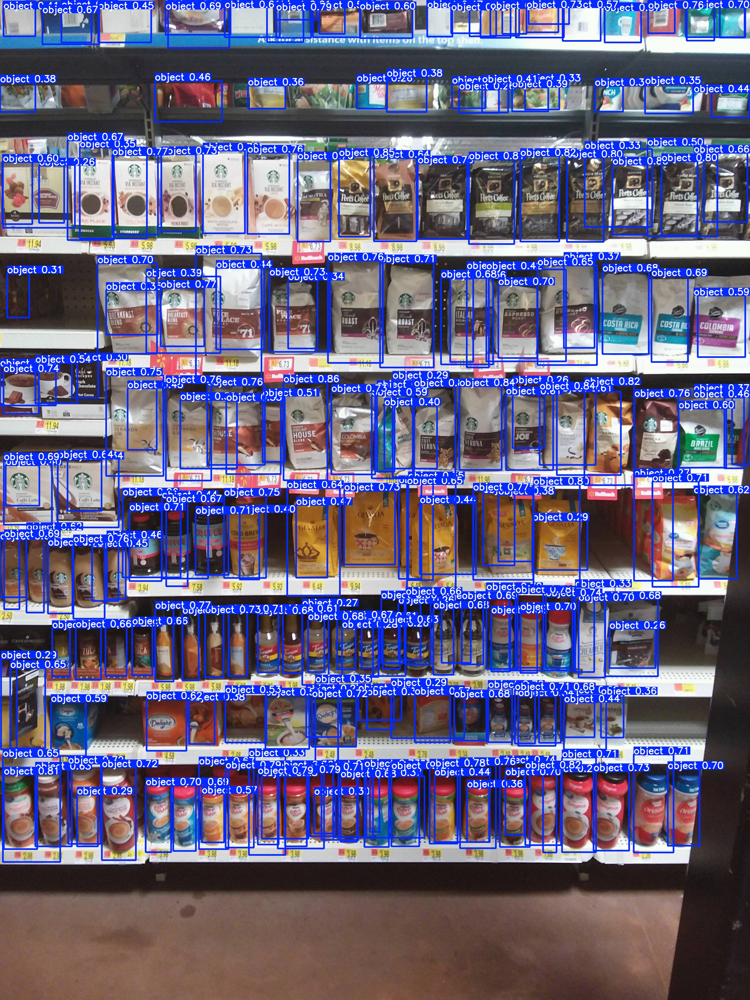

In [8]:
import IPython

# Path to the prediction file
img_file = "runs/detect/exp/test_0.jpg"

# Show the image
IPython.display.Image(img_file)

<a name="conversion"></a>

## 🗂️ Conversion

By default, the library saves the weights with the best performance into the `best_ckpt.pt` file inside the corresponding run folder. We'll rename it to reflect the model better.

In [ ]:
import shutil

shutil.copy("runs/train/exp/weights/best.pt", "yolov5ntrained.pt")

If you run the `.ipynb` script on a **Windows machine**, Python's `pickle` will serialize paths as `WindowsPath`, which can cause the model converter to fail.  
That’s why you should run the code below to fix the paths inside the `.pt` file.

If you are **not** on a Windows machine, you can skip this step.


In [ ]:
import torch
from pathlib import Path, WindowsPath

path = "yolov5ntrained.pt"
model = torch.load(path, map_location='cpu')

def normalise(obj):
    if isinstance(obj, dict):
        return {k: normalise(v) for k, v in obj.items()}
    if isinstance(obj, (WindowsPath, Path)):
        return str(obj).replace("\\", "/")
    if isinstance(obj, str) and ("\\" in obj or "/" in obj):
        return obj.replace("\\", "/")
    return obj

model["opt"] = normalise(model["opt"])
torch.save(model, "yolov5ntrained.pt")

We have the trained model, and the goal is to deploy it to the Luxonis device. The model's specific format depends on the Luxonis device series you have. We will show you how to use our [`ModelConverter`](https://github.com/luxonis/modelconverter) to convert the model as simply as possible. 

We'll start by installing the `ModelConverter`.

In [ ]:
%pip install -q modelconv==0.4.0 -U

We will use the `ModelConverter` Python API, which leverages our [`HubAI`](https://hub.luxonis.com) platform to perform model conversion in the background. To get started, you'll need to create an account on `HubAI` and obtain your team’s API key.

In [ ]:
HUBAI_API_KEY = "<YOUR_HUBAI_API_KEY>"

Model conversion can be done via either the CLI or the Python API — here, we'll use the latter. For more information, see the [online usage section](https://github.com/luxonis/modelconverter?tab=readme-ov-file#online-usage) of the documentation.

The call below creates a new model card within your team on `HubAI`, uploads the model file and metadata, then performs cloud-side conversion to the selected target platform (e.g., [`RVC2`](https://rvc4.docs.luxonis.com/hardware/platform/rvc/rvc2/), [`RVC4`](https://rvc4.docs.luxonis.com/hardware/platform/rvc/rvc4/)). Once completed, the converted model is automatically downloaded to your device.

For HubAI-specific conversion parameters, refer to the [online conversion section](https://github.com/luxonis/modelconverter/tree/e6a3478ba47d8f92d4d60217f2aee0f4f468cb14/modelconverter/hub#online-conversion) of the ModelConverter documentation. Platform-specific parameters are also documented there.


In [ ]:
from modelconverter import convert

converted_model = convert.RVC2(
    api_key=HUBAI_API_KEY,
    path="yolov5ntrained.pt",
    name="YOLOv5 Nano SKU-110K",
    description_short="Trained YOLOv5 nano object detection model on SKU-110K dataset.",
    yolo_version="yolov5",
    yolo_input_shape="512 288",
    yolo_class_names=["object"],
    tasks=["OBJECT_DETECTION"],
    license_type="MIT",
    is_public=False
)

We have successfully converted our trained model for an RVC2 device, so let's test it! Please copy the path to the downloaded archive with the converted model from the output log of the last code cell; we will use it in the next section.

In [ ]:
MODEL_PATH = "<YOUR_DOWNLOADED_MODEL_ARCHIVE_PATH>"

<a name="depthai-script"></a>

## 📷 DepthAI Script

To test our model on one of our cameras, we first need to install [`DepthAI`](https://rvc4.docs.luxonis.com/software/) in version 3 and [`DepthAI Nodes`](https://rvc4.docs.luxonis.com/software/ai-inference/depthai-nodes/). Moreover, the script we'll write must run locally and require a Luxonis device connected to your machine.

In [ ]:
%pip install -q depthai==3.0.0rc2 -U
%pip install -q depthai-nodes==0.3.0 -U

To run the model on a DepthAI device using the script below, please note the following:

- You can view the output stream by opening [http://localhost:8082](http://localhost:8082) in your browser.

- If you're running the script from a Jupyter Notebook, the output may not appear directly within the notebook. The script should print a link pointing to [http://localhost:8082](http://localhost:8082) for accessing the stream.

- To stop the video stream, press **`q`** while focused on the visualizer page.

In [9]:
DEVICE = None # Set to None to use the default device, or you can specify a specific device IP

In [ ]:
import depthai as dai
from depthai_nodes.node import ParsingNeuralNetwork, ImgDetectionsBridge

device = dai.Device(dai.DeviceInfo(DEVICE)) if DEVICE else dai.Device()
platform = device.getPlatform()
img_frame_type = dai.ImgFrame.Type.BGR888i if platform.name == "RVC4" else dai.ImgFrame.Type.BGR888p
visualizer = dai.RemoteConnection(httpPort=8082)

with dai.Pipeline(device) as pipeline:
    cam = pipeline.create(dai.node.Camera).build()
    nn_archive = dai.NNArchive(MODEL_PATH)
    # Create the neural network node
    nn_with_parser = pipeline.create(ParsingNeuralNetwork).build(
        cam.requestOutput((512, 288), type=img_frame_type, fps=30), 
        nn_archive
    )

    # Bridge the detections to the visualizer
    label_encoding = {k: v for k, v in enumerate(nn_archive.getConfig().model.heads[0].metadata.classes)}
    bridge = pipeline.create(ImgDetectionsBridge).build(nn_with_parser.out)
    bridge.setLabelEncoding(label_encoding)

    # Configure the visualizer node
    visualizer.addTopic("Video", nn_with_parser.passthrough, "images")
    visualizer.addTopic("Detections", bridge.out, "detections")

    pipeline.start()
    visualizer.registerPipeline(pipeline)
    
    while pipeline.isRunning():
        key = visualizer.waitKey(1)
        if key == ord("q"):
            print("Got q key from the remote connection!")
            break

Yay! 🎉🎉🎉 Huge congratulations, you have successfully finished this tutorial in which you trained and deployed a pre-trained YOLOv5 nano object detection model to our cameras!